<a href="https://colab.research.google.com/github/elifberkman/hugging-face-test/blob/master/huggingface_bootcamp1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Huggingface Bootcamp

In [ ]:
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

Tue Jul 23 19:23:07 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA A100-SXM4-40GB          Off | 00000000:00:04.0 Off |                    0 |
| N/A   30C    P0              42W / 400W |      2MiB / 40960MiB |      0%      Default |
|                                         |                      |             Disabled |
+-----------------------------------------+----------------------+--

In [ ]:
from psutil import virtual_memory
ram_gb = virtual_memory().total / 1e9
print('Your runtime has {:.1f} gigabytes of available RAM\n'.format(ram_gb))

if ram_gb < 20:
  print('Not using a high-RAM runtime')
else:
  print('You are using a high-RAM runtime!')

Your runtime has 89.6 gigabytes of available RAM

You are using a high-RAM runtime!


In [ ]:
!nvidia-smi -L

GPU 0: Tesla T4 (UUID: GPU-6813da11-c02a-6a3d-4cab-f08072be41d7)


In [7]:
def mount_path(path):
  from google.colab import drive

  DRIVE_PATH = path
  mount='/content/drive/'
  drive.mount(mount)
  drive_root = mount + DRIVE_PATH

  %cd $drive_root

In [8]:
# Change working directory if working in COLAB
try:
  from google.colab import drive
  IN_COLAB=True
  print("We're running Colab")
  mount_path("MyDrive/Colab Notebooks/udemy-courses/learn-huggingface-bootcamp")
except:
  IN_COLAB=False

We're running Colab
Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).
/content/drive/MyDrive/Colab Notebooks/udemy-courses/learn-huggingface-bootcamp


In [9]:
!pwd

/content/drive/MyDrive/Colab Notebooks/udemy-courses/learn-huggingface-bootcamp


In [ ]:
pip install datasets transformers diffusers accelerate opencv-python

In [ ]:
pip install librosa

In [ ]:
import datasets
from datasets import load_dataset
import torch
import transformers
datasets.__version__

'2.20.0'

In [ ]:
# Set up the device
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
device

device(type='cuda')

# NLP with Transformers Library on HuggingFace

## Huggingface Basics

In [ ]:
transformers.__version__

'4.42.4'

In [ ]:
reviews = load_dataset('rotten_tomatoes')

Generating train split:   0%|          | 0/8530 [00:00<?, ? examples/s]

Generating validation split:   0%|          | 0/1066 [00:00<?, ? examples/s]

Generating test split:   0%|          | 0/1066 [00:00<?, ? examples/s]

In [ ]:
type(reviews)

datasets.dataset_dict.DatasetDict

In [ ]:
reviews

DatasetDict({
    train: Dataset({
        features: ['text', 'label'],
        num_rows: 8530
    })
    validation: Dataset({
        features: ['text', 'label'],
        num_rows: 1066
    })
    test: Dataset({
        features: ['text', 'label'],
        num_rows: 1066
    })
})

In [ ]:
reviews['train']

Dataset({
    features: ['text', 'label'],
    num_rows: 8530
})

In [ ]:
help(reviews['train'])

Help on Dataset in module datasets.arrow_dataset object:

class Dataset(DatasetInfoMixin, datasets.search.IndexableMixin, TensorflowDatasetMixin)
 |  Dataset(arrow_table: datasets.table.Table, info: Optional[datasets.info.DatasetInfo] = None, split: Optional[datasets.splits.NamedSplit] = None, indices_table: Optional[datasets.table.Table] = None, fingerprint: Optional[str] = None)
 |  
 |  A Dataset backed by an Arrow table.
 |  
 |  Method resolution order:
 |      Dataset
 |      DatasetInfoMixin
 |      datasets.search.IndexableMixin
 |      TensorflowDatasetMixin
 |      builtins.object
 |  
 |  Methods defined here:
 |  
 |  __del__(self)
 |  
 |  __enter__(self)
 |  
 |  __exit__(self, exc_type, exc_val, exc_tb)
 |  
 |  __getitem__(self, key)
 |      Can be used to index columns (by string names) or rows (by integer index or iterable of indices or bools).
 |  
 |  __getitems__(self, keys: List) -> List
 |      Can be used to get a batch using a list of integers indices.
 |  
 | 

In [ ]:
reviews['test'].to_pandas()['text'][0]

'lovingly photographed in the manner of a golden book sprung to life , stuart little 2 manages sweetness largely without stickiness .'

In [ ]:
from transformers import pipeline

In [ ]:
classifier = pipeline('sentiment-analysis')

No model was supplied, defaulted to distilbert/distilbert-base-uncased-finetuned-sst-2-english and revision af0f99b (https://huggingface.co/distilbert/distilbert-base-uncased-finetuned-sst-2-english).
Using a pipeline without specifying a model name and revision in production is not recommended.


config.json:   0%|          | 0.00/629 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/268M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

In [ ]:
classifier('This was a great movie!')

[{'label': 'POSITIVE', 'score': 0.999869704246521}]

In [ ]:
def score(review_text):
  return classifier(review_text)[0]['score']

In [ ]:
test_df = reviews['test'].to_pandas()

In [ ]:
test_df['model_prediction'] = test_df['text'].apply(score)

In [ ]:
print(test_df.iloc[2]['text'])

it's like a " big chill " reunion of the baader-meinhof gang , only these guys are more harmless pranksters than political activists .


## NLP Pipelines

https://huggingface.co/docs/transformers/en/main_classes/pipelines

In [ ]:
from transformers import pipeline

In [ ]:
help(pipeline)

In [ ]:
pipe = pipeline(task='text-classification')

No model was supplied, defaulted to distilbert/distilbert-base-uncased-finetuned-sst-2-english and revision af0f99b (https://huggingface.co/distilbert/distilbert-base-uncased-finetuned-sst-2-english).
Using a pipeline without specifying a model name and revision in production is not recommended.


In [ ]:
pipe('The resturant is ok')

[{'label': 'POSITIVE', 'score': 0.9998278617858887}]

https://huggingface.co/ProsusAI/finbert

In [ ]:
pipe = pipeline("text-classification", model="ProsusAI/finbert")

config.json:   0%|          | 0.00/758 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/438M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/252 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

In [ ]:
pipe('Shares of food delivery companies surged despite the catastrophic impact of the coronavirus')

[{'label': 'positive', 'score': 0.9311507940292358}]

In [ ]:
tweets = ['this stock is going up', 'this company is going to crash and burn']
pipe(tweets)

[{'label': 'neutral', 'score': 0.8116365075111389},
 {'label': 'negative', 'score': 0.7519482374191284}]

In [ ]:
ner_tag_pipe = pipeline('ner')

No model was supplied, defaulted to dbmdz/bert-large-cased-finetuned-conll03-english and revision f2482bf (https://huggingface.co/dbmdz/bert-large-cased-finetuned-conll03-english).
Using a pipeline without specifying a model name and revision in production is not recommended.


config.json:   0%|          | 0.00/998 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.33G [00:00<?, ?B/s]

Some weights of the model checkpoint at dbmdz/bert-large-cased-finetuned-conll03-english were not used when initializing BertForTokenClassification: ['bert.pooler.dense.bias', 'bert.pooler.dense.weight']
- This IS expected if you are initializing BertForTokenClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertForTokenClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


tokenizer_config.json:   0%|          | 0.00/60.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/213k [00:00<?, ?B/s]

In [ ]:
sentence = 'After working at Tesla I started to study Nikola Tesla a lot more, especially at university in the USA'
ner_tag_pipe(sentence)

[{'entity': 'I-ORG',
  'score': 0.92580396,
  'index': 4,
  'word': 'Te',
  'start': 17,
  'end': 19},
 {'entity': 'I-ORG',
  'score': 0.39902237,
  'index': 5,
  'word': '##sla',
  'start': 19,
  'end': 22},
 {'entity': 'I-PER',
  'score': 0.9969952,
  'index': 10,
  'word': 'Nikola',
  'start': 42,
  'end': 48},
 {'entity': 'I-PER',
  'score': 0.9904022,
  'index': 11,
  'word': 'Te',
  'start': 49,
  'end': 51},
 {'entity': 'I-PER',
  'score': 0.8762835,
  'index': 12,
  'word': '##sla',
  'start': 51,
  'end': 54},
 {'entity': 'I-LOC',
  'score': 0.9997229,
  'index': 22,
  'word': 'USA',
  'start': 99,
  'end': 102}]

In [ ]:
qa_pipe = pipeline('question-answering')

No model was supplied, defaulted to distilbert/distilbert-base-cased-distilled-squad and revision 626af31 (https://huggingface.co/distilbert/distilbert-base-cased-distilled-squad).
Using a pipeline without specifying a model name and revision in production is not recommended.


config.json:   0%|          | 0.00/473 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/261M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/49.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/213k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/436k [00:00<?, ?B/s]

In [ ]:
text = """
D-Day, marked on June 6, 1944, stands as one of the most significant military operations in history,
initiating the Allied invasion of Nazi-occupied Europe during World War II. Known as Operation Overlord,
this massive amphibious assault involved nearly 160,000 Allied troops landing on the beaches of Normandy,
France, across five sectors: Utah, Omaha, Gold, Juno, and Sword. Supported by over 5,000 ships and 13,000
aircraft, the operation was preceded by extensive aerial and naval bombardment and an airborne assault.
The invasion set the stage for the liberation of Western Europe from Nazi control, despite the heavy
casualties and formidable German defenses. This day not only demonstrated the logistical prowess
and courage of the Allied forces but also marked a turning point in the war, leading to the eventual
defeat of Nazi Germany.
"""

In [ ]:
question = "What were the five beach sectors on D-Day?"

In [ ]:
result = qa_pipe(question=question, context=text)
result

{'score': 0.9430820345878601,
 'start': 345,
 'end': 379,
 'answer': 'Utah, Omaha, Gold, Juno, and Sword'}

In [ ]:
translate_pipe = pipeline("translation_en_to_fr")

No model was supplied, defaulted to google-t5/t5-base and revision 686f1db (https://huggingface.co/google-t5/t5-base).
Using a pipeline without specifying a model name and revision in production is not recommended.


config.json:   0%|          | 0.00/1.21k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/892M [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/147 [00:00<?, ?B/s]

spiece.model:   0%|          | 0.00/792k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.39M [00:00<?, ?B/s]

In [ ]:
translate_pipe("Hello, my name is Elif. What is your name?")

[{'translation_text': 'Bonjour, mon nom est Elif, quel est votre nom ?'}]

In [ ]:
translate_pipe("Hello, I am called Elif. What is your name?")

[{'translation_text': "Bonjour, je m'appelle Elif, quel est votre nom ?"}]

## LLM - Text Tokenization and Probabilities

In [ ]:
import torch

In [ ]:
torch.__version__

'2.3.1+cu121'

In [ ]:
import transformers

In [ ]:
transformers.__version__

'4.42.4'

In [ ]:
from transformers import AutoTokenizer

In [ ]:
tokenizer = AutoTokenizer.from_pretrained("gpt2")

tokenizer_config.json:   0%|          | 0.00/26.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/665 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/1.04M [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/456k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.36M [00:00<?, ?B/s]

In [ ]:
sentence = "Preposterous, prepare I'm flabbergastes!"

In [ ]:
# words -> tokens -> unique ID -> vector embed
input_ids = tokenizer(sentence, return_tensors='pt').input_ids
input_ids

tensor([[37534,  6197,   516,    11,  8335,   314,  1101,   781,   397,  3900,
           459,   274,     0]])

In [ ]:
for token_id in input_ids[0]:
  print(tokenizer.decode(token_id))

Prep
oster
ous
,
 prepare
 I
'm
 fl
ab
berg
ast
es
!


In [ ]:
sentence = "I skip across the"
input_ids = tokenizer(sentence, return_tensors='pt').input_ids

In [ ]:
input_ids.shape

torch.Size([1, 4])

In [ ]:
from transformers import AutoModelForCausalLM

In [ ]:
gpt2 = AutoModelForCausalLM.from_pretrained("gpt2")

model.safetensors:   0%|          | 0.00/548M [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/124 [00:00<?, ?B/s]

In [ ]:
outputs = gpt2(input_ids)

In [ ]:
outputs.logits.shape # number of batches, sequence length, total vocabulary size

torch.Size([1, 4, 50257])

In [ ]:
outputs.logits

tensor([[[-39.3084, -39.0100, -41.8374,  ..., -46.9337, -44.9074, -39.5149],
         [-78.0579, -78.4766, -82.9907,  ..., -87.3913, -86.9834, -79.6007],
         [-73.0664, -74.0119, -78.5556,  ..., -81.0934, -82.5249, -75.8570],
         [-87.5486, -86.0567, -88.3320,  ..., -88.2509, -90.5480, -86.1209]]],
       grad_fn=<UnsafeViewBackward0>)

In [ ]:
# last token logits
final_logits = gpt2(input_ids).logits[0, -1]

In [ ]:
final_logits

tensor([-87.5486, -86.0567, -88.3320,  ..., -88.2509, -90.5480, -86.1209],
       grad_fn=<SelectBackward0>)

In [ ]:
final_logits.argmax() # Token ID <--> Index Location Logits

tensor(1627)

In [ ]:
tokenizer.decode(final_logits.argmax())

' line'

In [ ]:
top10_logits = torch.topk(final_logits, 10)

In [ ]:
for index in top10_logits.indices:
  print(tokenizer.decode(index))

 line
 street
 river
 room
 pond
 bridge
 border
 country
 road
 board


In [ ]:
final_logits.softmax(dim=0)

tensor([5.5734e-07, 2.4776e-06, 2.5463e-07,  ..., 2.7614e-07, 2.7765e-08,
        2.3236e-06], grad_fn=<SoftmaxBackward0>)

In [ ]:
top10 = torch.topk(final_logits.softmax(dim=0), 10)

In [ ]:
for value, index in zip(top10.values, top10.indices):
  print(f"{tokenizer.decode(index)} -- {value.item():.1%}")

 line -- 3.6%
 street -- 2.7%
 river -- 2.2%
 room -- 1.9%
 pond -- 1.8%
 bridge -- 1.7%
 border -- 1.7%
 country -- 1.7%
 road -- 1.6%
 board -- 0.9%


## LLM - Text Generation

In [ ]:
output_ids = gpt2.generate(input_ids, max_new_tokens=20)

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


In [ ]:
len(output_ids[0])

24

In [ ]:
decoded_text = tokenizer.decode(output_ids[0])

In [ ]:
print(decoded_text)

I skip across the line to the next section.

The first thing to note is that the first line is a


In [ ]:
output_ids = gpt2.generate(input_ids, max_new_tokens=20, repetition_penalty=1.5)

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


In [ ]:
decoded_text = tokenizer.decode(output_ids[0])
print(decoded_text)

I skip across the line to a place where I can see it.

The next time you're in town,


In [ ]:
output_ids = gpt2.generate(input_ids, max_new_tokens=20, do_sample=True)

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


In [ ]:
decoded_text = tokenizer.decode(output_ids[0])
print(decoded_text)

I skip across the street, I'll wait on the next car, I'll have that car back, I'll have


In [ ]:
output_ids = gpt2.generate(input_ids, max_new_tokens=20, do_sample=True, top_k=5, top_p=0.94)

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


In [ ]:
decoded_text = tokenizer.decode(output_ids[0])
print(decoded_text)

I skip across the line to say "I don't care what you do" and "I'm a big fan of


In [ ]:
output_ids = gpt2.generate(input_ids, max_new_tokens=20, do_sample=True, temperature=1.5)

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


In [ ]:
decoded_text = tokenizer.decode(output_ids[0])
print(decoded_text)

I skip across the floor when you see it. That might seem strange, when your brother is the star in a crowded


In [ ]:
output_ids = gpt2.generate(input_ids, max_new_tokens=20, do_sample=True, temperature=0.1)

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


In [ ]:
decoded_text = tokenizer.decode(output_ids[0])
print(decoded_text)

I skip across the line to the next section, and I'll explain why.

The first thing to note is


In [ ]:
help(gpt2)

Help on GPT2LMHeadModel in module transformers.models.gpt2.modeling_gpt2 object:

class GPT2LMHeadModel(GPT2PreTrainedModel)
 |  GPT2LMHeadModel(config)
 |  
 |  The GPT2 Model transformer with a language modeling head on top (linear layer with weights tied to the input
 |  embeddings).
 |  
 |  
 |  This model inherits from [`PreTrainedModel`]. Check the superclass documentation for the generic methods the
 |  library implements for all its model (such as downloading or saving, resizing the input embeddings, pruning heads
 |  etc.)
 |  
 |  This model is also a PyTorch [torch.nn.Module](https://pytorch.org/docs/stable/nn.html#torch.nn.Module) subclass.
 |  Use it as a regular PyTorch Module and refer to the PyTorch documentation for all matter related to general usage
 |  and behavior.
 |  
 |  Parameters:
 |      config ([`GPT2Config`]): Model configuration class with all the parameters of the model.
 |          Initializing with a config file does not load the weights associated wit

In [ ]:
# Use a pipeline as a high-level helper
from transformers import pipeline

pipe = pipeline("text-generation", model="openai-community/gpt2")

config.json:   0%|          | 0.00/665 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/548M [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/124 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/26.0 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/1.04M [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/456k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.36M [00:00<?, ?B/s]

In [ ]:
pipe("I went to the happy store today and bought a")

Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


[{'generated_text': "I went to the happy store today and bought a bag and was pleasantly surprised that I haven't made an attempt at this. I tried the Banana Bean Chequitata, which is better than the one I ordered, but I wouldn't recommend it"}]

# Image Models - Diffusers Library with HuggingFace

## Image Data with Python

In [ ]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
PUPPY_IMAGE_PATH = '02-Diffusers/puppy.png'

In [ ]:
pic = Image.open(PUPPY_IMAGE_PATH)

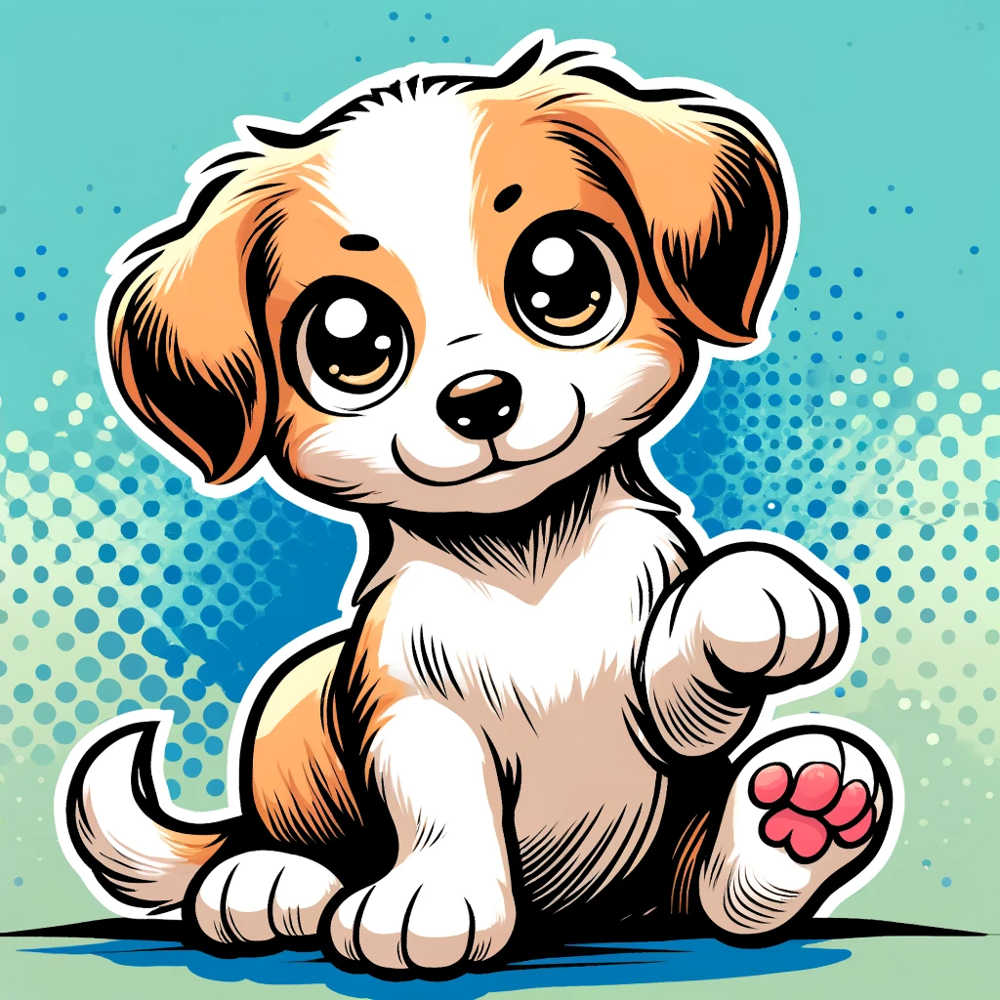

In [ ]:
pic

In [ ]:
type(pic)

PIL.PngImagePlugin.PngImageFile

In [ ]:
pic_arr = np.asarray(pic)
pic_arr.shape

(1024, 1024, 4)

In [ ]:
# pic_arr/255

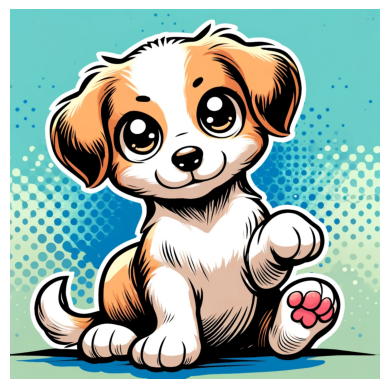

In [ ]:
plt.imshow(pic)
plt.axis(False);

In [ ]:
pic_red = pic_arr.copy()
pic_red.shape

(1024, 1024, 4)

In [ ]:
#RGB
pic_red[:, :, 1] = 0 # GREEN CHANNEL set --> 0
pic_red[:, :, 2] = 0 # BLUE CHANNEL set --> 0

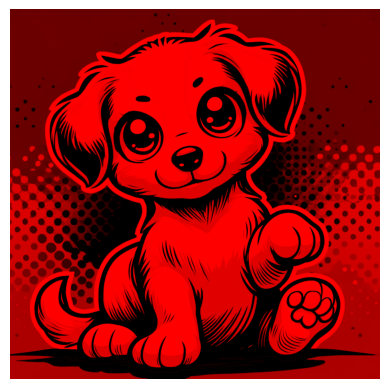

In [ ]:
plt.imshow(pic_red)
plt.axis(False);

In [ ]:
# !pip install opencv-python

In [ ]:
# !pip install opencv-python-headless # Amazon SageMaker Studio

In [ ]:
import cv2

In [ ]:
img = cv2.imread(PUPPY_IMAGE_PATH)

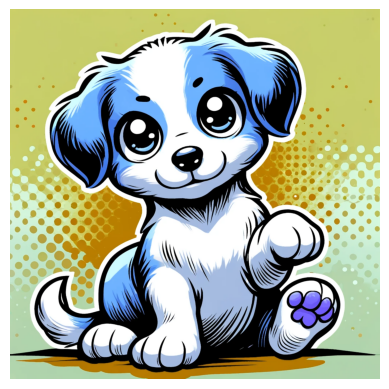

In [ ]:
plt.imshow(img) # Open CV:BGR matplotlib:RGB
plt.axis("off");

In [ ]:
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

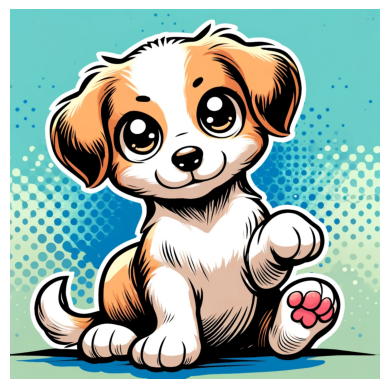

In [ ]:
plt.imshow(img_rgb)
plt.axis("off");

In [ ]:
img_gray = cv2.imread(PUPPY_IMAGE_PATH, cv2.IMREAD_GRAYSCALE)

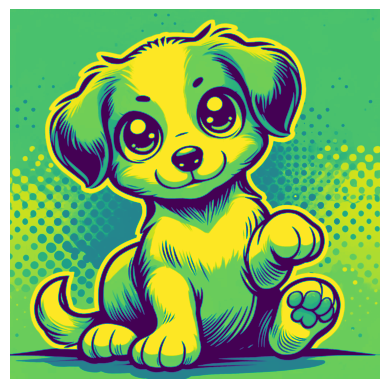

In [ ]:
# Why we can't see gray image: https://matplotlib.org/stable/users/explain/colors/colormaps.html
# default: rcParams["image.cmap"] (default: 'viridis')
plt.imshow(img_gray)
plt.axis("off");

If the image still doesn't appear gray, make sure that the image array values are within the correct range. Grayscale images typically have values ranging from 0 (black) to 1 (white) for floating-point arrays, or from 0 to 255 for integer arrays.

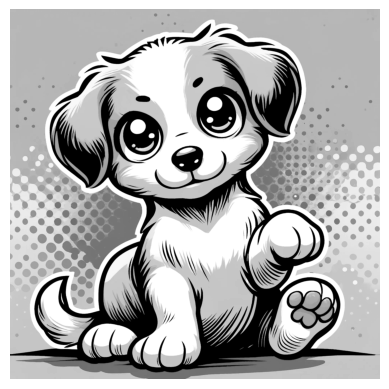

In [ ]:
plt.imshow(img_gray, cmap='gray')
plt.axis("off");

In [ ]:
import matplotlib.pyplot as plt

# Print the list of colormaps
print(plt.colormaps())

['magma', 'inferno', 'plasma', 'viridis', 'cividis', 'twilight', 'twilight_shifted', 'turbo', 'Blues', 'BrBG', 'BuGn', 'BuPu', 'CMRmap', 'GnBu', 'Greens', 'Greys', 'OrRd', 'Oranges', 'PRGn', 'PiYG', 'PuBu', 'PuBuGn', 'PuOr', 'PuRd', 'Purples', 'RdBu', 'RdGy', 'RdPu', 'RdYlBu', 'RdYlGn', 'Reds', 'Spectral', 'Wistia', 'YlGn', 'YlGnBu', 'YlOrBr', 'YlOrRd', 'afmhot', 'autumn', 'binary', 'bone', 'brg', 'bwr', 'cool', 'coolwarm', 'copper', 'cubehelix', 'flag', 'gist_earth', 'gist_gray', 'gist_heat', 'gist_ncar', 'gist_rainbow', 'gist_stern', 'gist_yarg', 'gnuplot', 'gnuplot2', 'gray', 'hot', 'hsv', 'jet', 'nipy_spectral', 'ocean', 'pink', 'prism', 'rainbow', 'seismic', 'spring', 'summer', 'terrain', 'winter', 'Accent', 'Dark2', 'Paired', 'Pastel1', 'Pastel2', 'Set1', 'Set2', 'Set3', 'tab10', 'tab20', 'tab20b', 'tab20c', 'magma_r', 'inferno_r', 'plasma_r', 'viridis_r', 'cividis_r', 'twilight_r', 'twilight_shifted_r', 'turbo_r', 'Blues_r', 'BrBG_r', 'BuGn_r', 'BuPu_r', 'CMRmap_r', 'GnBu_r', 'G

In [ ]:
img_resize = cv2.resize(img, (500, 1024))

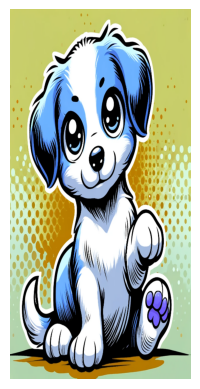

In [ ]:
plt.imshow(img_resize)
plt.axis("off");

In [ ]:
w_ratio = 0.5
h_ratio = 0.5
new_img = cv2.resize(img, (0,0), fx=w_ratio, fy=h_ratio)
new_img.shape

(512, 512, 3)

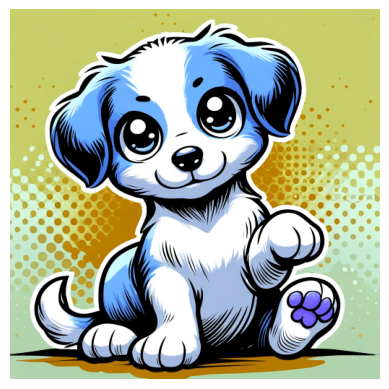

In [ ]:
plt.imshow(new_img)
plt.axis("off");

## Understanding Text to Image Models

CLIP: Contrastive Language-Image Pre-training

In [ ]:
from diffusers import DDPMPipeline

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

In [ ]:
ddpm = DDPMPipeline.from_pretrained("google/ddpm-celebahq-256").to(device)

model_index.json:   0%|          | 0.00/180 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors not found


Fetching 4 files:   0%|          | 0/4 [00:00<?, ?it/s]

diffusion_pytorch_model.bin:   0%|          | 0.00/455M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/790 [00:00<?, ?B/s]

scheduler_config.json:   0%|          | 0.00/256 [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/2 [00:00<?, ?it/s]

An error occurred while trying to fetch /root/.cache/huggingface/hub/models--google--ddpm-celebahq-256/snapshots/cd5c944777ea2668051904ead6cc120739b86c4d: Error no file named diffusion_pytorch_model.safetensors found in directory /root/.cache/huggingface/hub/models--google--ddpm-celebahq-256/snapshots/cd5c944777ea2668051904ead6cc120739b86c4d.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.


  0%|          | 0/30 [00:00<?, ?it/s]

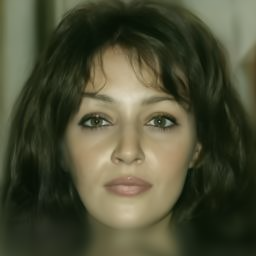

In [ ]:
image = ddpm(num_inference_steps=30).images[0]
image

In [ ]:
image.size

(256, 256)

In [ ]:
from diffusers import DDPMScheduler, UNet2DModel

In [ ]:
scheduler = DDPMScheduler.from_pretrained("google/ddpm-celebahq-256")

In [ ]:
model = UNet2DModel.from_pretrained("google/ddpm-celebahq-256").to(device)

An error occurred while trying to fetch google/ddpm-celebahq-256: google/ddpm-celebahq-256 does not appear to have a file named diffusion_pytorch_model.safetensors.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.


In [ ]:
# set the number of time steps we want to run the denoising process for
scheduler.set_timesteps(50)

In [ ]:
len(scheduler.timesteps)

50

In [ ]:
# And then setting the schedule or time steps creates a tensor with evenly spaced elements.
scheduler.timesteps

tensor([980, 960, 940, 920, 900, 880, 860, 840, 820, 800, 780, 760, 740, 720,
        700, 680, 660, 640, 620, 600, 580, 560, 540, 520, 500, 480, 460, 440,
        420, 400, 380, 360, 340, 320, 300, 280, 260, 240, 220, 200, 180, 160,
        140, 120, 100,  80,  60,  40,  20,   0])

In [ ]:
# create some random noise
sample_size = model.config.sample_size
sample_size

256

In [ ]:
nosie = torch.randn((1, 3, sample_size, sample_size), device=device)

In [ ]:
input = nosie

In [ ]:
for t in scheduler.timesteps:
  with torch.no_grad():
    noisy_residual = model(input, t).sample

  previous_noisy_sample = scheduler.step(noisy_residual, t, input).prev_sample

  input = previous_noisy_sample

In [ ]:
input.shape

torch.Size([1, 3, 256, 256])

In [ ]:
from PIL import Image
import numpy as np

In [ ]:
image = (input /2 + 0.5).clamp(0, 1).squeeze()

In [ ]:
image = (image.permute(1, 2, 0)*255).round().to(torch.uint8).cpu().numpy()

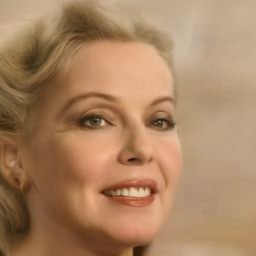

In [ ]:
image = Image.fromarray(image)
image

## Autopipeline with Diffusers

https://huggingface.co/dreamlike-art/dreamlike-photoreal-2.0

https://huggingface.co/docs/diffusers/en/tutorials/autopipeline

In [ ]:
from diffusers import AutoPipelineForText2Image

/usr/local/lib/python3.10/dist-packages/diffusers/models/vq_model.py:20: FutureWarning: `VQEncoderOutput` is deprecated and will be removed in version 0.31. Importing `VQEncoderOutput` from `diffusers.models.vq_model` is deprecated and this will be removed in a future version. Please use `from diffusers.models.autoencoders.vq_model import VQEncoderOutput`, instead.
  deprecate("VQEncoderOutput", "0.31", deprecation_message)
/usr/local/lib/python3.10/dist-packages/diffusers/models/vq_model.py:25: FutureWarning: `VQModel` is deprecated and will be removed in version 0.31. Importing `VQModel` from `diffusers.models.vq_model` is deprecated and this will be removed in a future version. Please use `from diffusers.models.autoencoders.vq_model import VQModel`, instead.
  deprecate("VQModel", "0.31", deprecation_message)


In [ ]:
pipeline = AutoPipelineForText2Image.from_pretrained("dreamlike-art/dreamlike-photoreal-2.0",
                                                     torch_dtype=torch.float16,
                                                     use_safetensors=True).to(device)

Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

In [ ]:
prompt = 'cinematic photo of big bird in Paris, 35mm photo, film'

In [ ]:
image = pipeline(prompt).images[0]

  0%|          | 0/50 [00:00<?, ?it/s]

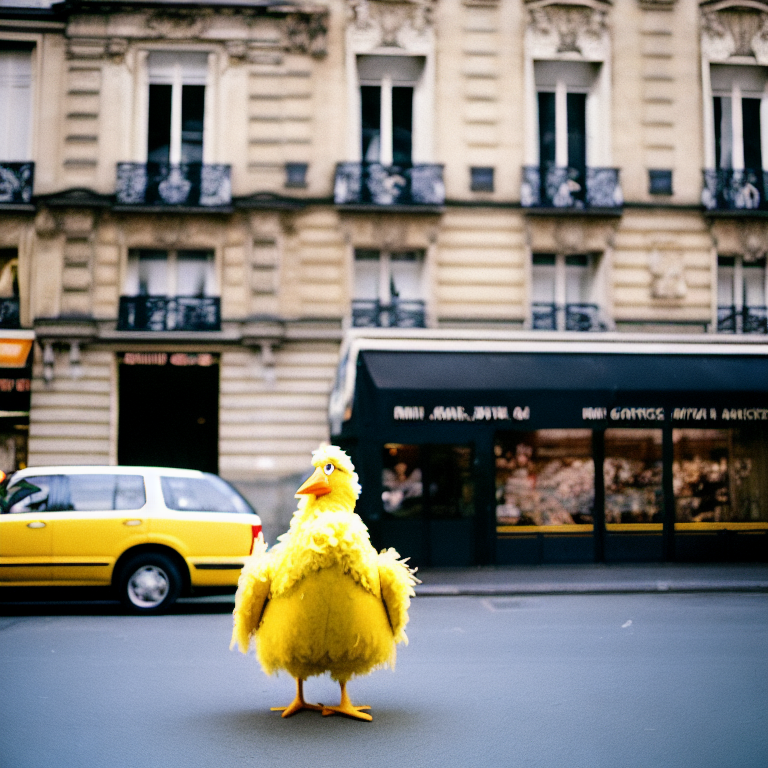

In [ ]:
image

In [ ]:
prompt = 'cinematic photo of big bird from Sesame Street in Paris, 35mm photo, film'

  0%|          | 0/50 [00:00<?, ?it/s]

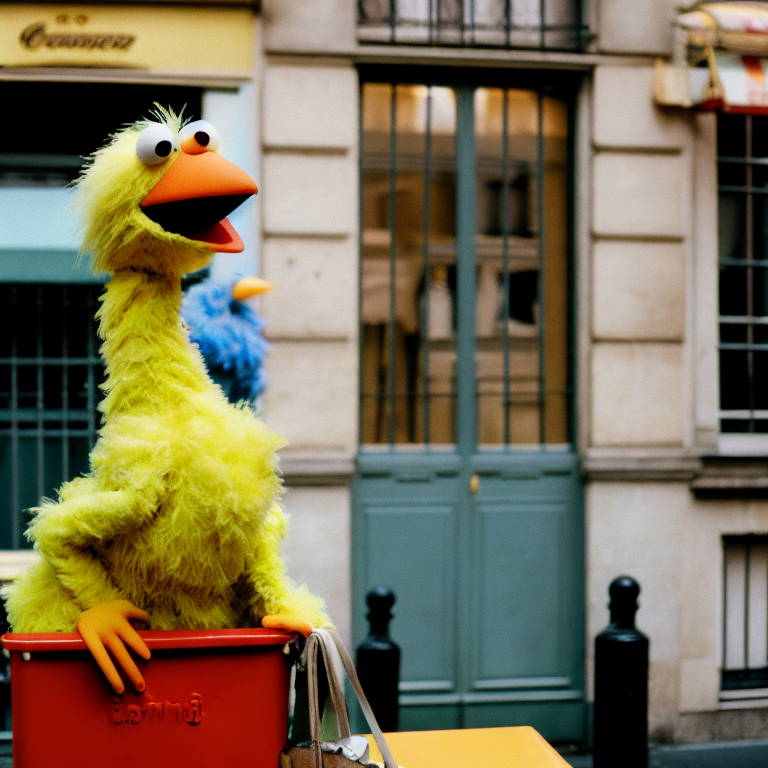

In [ ]:
image = pipeline(prompt).images[0]
image

In [ ]:
prompt = 'cinematic photo of Elmo from Sesame Street in Paris, 35mm photo, film'

  0%|          | 0/50 [00:00<?, ?it/s]

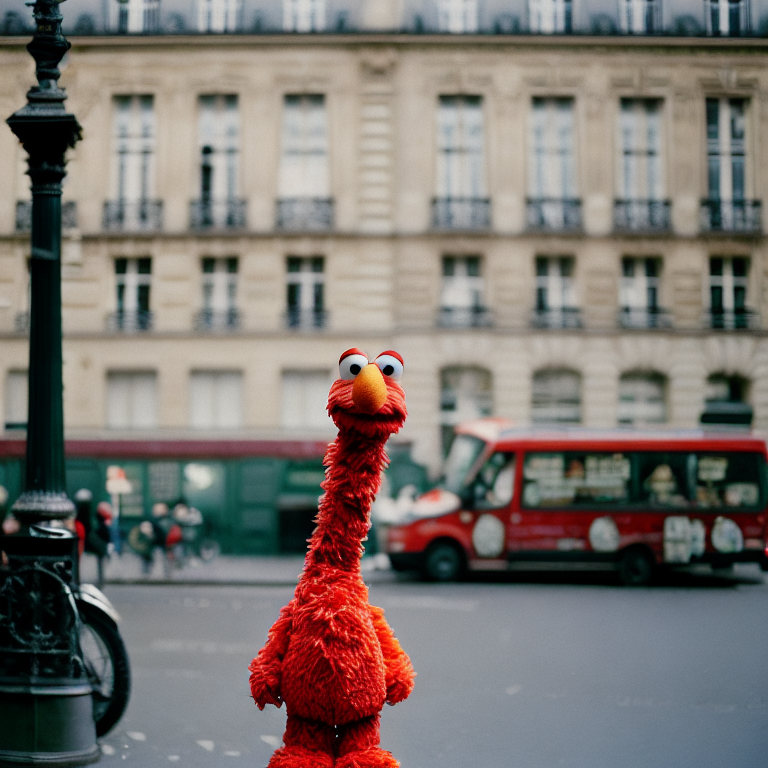

In [ ]:
image = pipeline(prompt).images[0]
image

# Video Models

- One of the latest advancements in generative models has been the development of video models has been the development of video models, allowing us to generate video from a single image or a text prompt.

- One of the most popular models in this space that is open-source is Stable Diffusion Video.

- Most of these models work the same way, they generate a series of images that (hopefully and with good data and good training) imitate the frames of a video, creating a series of images that would work well when formatted together to create a video.

https://arxiv.org/pdf/2311.15127

* **Training Process**:
  - Text-to-Image Pretraining
  - Video Pretraining
  - High-Quality Video Finetuning

* **How the Model Works**:
  - Latent Space Representation
  - Temporal Layers and Attention Mechanisms
  - Data Curation and Filtering
  - Fine-Grained Conditioning

### Training Process

* Text-to-Image Pretraining:
  - The initial stage involves training a text-to-image diffusion model. This model learns to generate images from text descriptions, forming a strong visual representation.
  - The Stable Diffusion 2.1 model is often used for this purpose. This model is trained on large-scale image datasets to understand how to convert textual descriptions into corresponding images.

* Video Pretraining:
  - Once the text-to-image model is well-trained, it is adapted for video generation. This adaptation involves inserting temporal layers into the model architecture, enabling it to handle sequence of frames (videos) rather than single images.
  - Video pretraining is done on large, curated datasets of low-resolution videos. The dataset used in this paper is called the Large Video Dataset (LVD), which consists of 580 million annotated video clips. The goal is to teach the model the basics of video dynamics, such as motion and temporal coherance.

* High-Quality Video Finetuning:
  - After the initial video pretraining, the model undergoes finetuning on a smaller set of high-quality videos at higher resolutions. This stage refines the model's ability to generate visually appealing and coherent high-resolution videos.
  - The finetuning dataset includes videos with rich motoin and high aesthetic value, ensuring the model produces high-quality outputs.

### How the model works?

* Latent Space Representation
  - The Stable Video Diffusion Model operates in a latent space, which means it generates compressed representations of video frames. This approach reduces computational complexity while maintaining high-quality outputs.
  - Latent space models learn to generate intermediate representations that are later decoded into full-resolution frames.
* Temporal Layers and Attention Mechanisms
  - The model architecture includes temporal convolution and attention layers added to the pretraind spatial layers.
  - These temporal layers allow the model to understand and generate the flow of motion across frames.
  - Attention mechanisms help the model focus on relevant parts of the video frames, ensuring coherence and consistency.
* Data Curation and Filtering
  - Data curation plays a critical role in the model's success. The training dataset is meticulously curated to remove static scenes, clips with excessive text, and low-quality videos.
  - Techniques like optical flow analysis and optical character recognition (OCR) are used for this filtering.
  - The curated dataset ensures that the model learns from high-quality and diverse examples, leading to better generalization and performance.
* Fine-Grained Conditioning
  - The model can be conditioned on various inputs, such as text descriptions or single images.
  - For example, in image-to-video generation, the model takes a single frame as input and generates a sequence of frames that follow logically from the input image.

## Stable Video Diffusion

https://huggingface.co/stabilityai/stable-video-diffusion-img2vid

In [ ]:
import torch
import diffusers
import transformers

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

In [ ]:
torch.__version__

'2.3.1+cu121'

In [ ]:
diffusers.__version__

'0.29.2'

In [ ]:
transformers.__version__

'4.42.4'

In [ ]:
from diffusers import StableVideoDiffusionPipeline

In [ ]:
pipe = StableVideoDiffusionPipeline.from_pretrained("stabilityai/stable-video-diffusion-img2vid")

In [ ]:
pipe.enable_model_cpu_offload()

In [ ]:
from diffusers.utils import load_image, export_to_video

In [ ]:
image = load_image("nasa.jpg")

In [ ]:
image.size # 3000, 3000

In [ ]:
image.resize((1024, 576)) ##  image doesn't look ok
# so he resize it with a tool alike photoshop and make it png

In [ ]:
image = load_image("nasa.png")

In [ ]:
image.size # 1024, 576

In [ ]:
generator = torch.manual_seed(42)

In [ ]:
frames = pipe(image, decode, chunk_size=8, generator=generator).frames[0]
# Out of memory -> restart kernel, if multiple notebooks open than restart your computer
# Specify lower float point precision

In [ ]:
pipe = StableVideoDiffusionPipeline.from_pretrained("stabilityai/stable-video-diffusion-img2vid",
                                                    torch_dtype=torch.float16,
                                                    variant='fp16')

pipe.enable_model_cpu_offload()

generator = torch.manual_seed(42)

frames = pipe(image, decode, chunk_size=8, generator=generator).frames[0]

In [ ]:
export_to_video(frames, 'generated.mp4', fps=7)

In [ ]:
type(frames[0])

In [ ]:
frames[0]

## I2VGen-XL

- Unlike Stable Video Diffusion, we can also add a text prompt along with an image to attempt to help guide the model to a particular output.

https://i2vgen-xl.github.io/

https://huggingface.co/docs/diffusers/en/api/pipelines/i2vgenxl


In [ ]:
import torch
torch.__version__

In [ ]:
import torch
torch.cuda.empty_cache()

In [ ]:
from diffusers import I2VGenXLPipeline

In [ ]:
import diffusers
diffusers.__version__

In [ ]:
repo_id = 'ali-vilab/i2vgen-xl'

In [ ]:
pipeline = I2VGenXLPipeline.from_pretrained(repo_id,
                                            torch_dtype=torch.float16,
                                            variant='fp16')
pipeline.enable_model_cpu_offload()

In [ ]:
image = load_image('astro_moon.png')

In [ ]:
prompt = 'astronaut on the moon jumping straight up'

In [ ]:
generator = torch.manual_seed(8888)

In [ ]:
frames = pipeline(prompt=prompt, image=image, generator=generator).frames[0]

In [ ]:
export_to_video(frames, 'astro_jump_vid.mp4', fps=8)

# Auido Models on Hugging Face

## Introduction to Audio

- Understanding Audio Data
- Processing Audio Data
- ML - Audio Classification
- ML - Audio Transcription
- ML - Audio Generation

## Understanding Audio Data

- Frequency and Sound
- Amplitude and Bit Depth
- Waves
- Frequency
- Spectograms

- Sound waves are when matter is vibrating, which transports energy through the medium.
- From a typical human perspective, we would think of this as air molecules at different pressures.
- However keep in mind that sound can travel through many mediums, for example when you hear sounds underwater.

- When recording sound, we have to choose a sampling rate (frequency), which is how often we are recording the changes in vibration.
- We sample in hertz Hz, which is a measurement per second, so 1 kHz is 1000 samples a second.
  - Typically, audio is sampled at 16 kHz, 44.1 kHz, or 192 kHz.

- When working with audio machine learning models, we often need to make sure the data we are using is at the same sampling rate that the model was trained on.
- ML models often use 16 kHz, since it balances data size with information signal, but really depends on the model and domain.

- Amplitude:
  - Describes sound pressure level at any given intant, measured in decibels (dB).
  - Perceived as loudness.

- Amplitude in Digital Audio vs "Real World":
  - Expressed in decibels (dB) like continuous audio signals.
  - Human hearing is logarithmic; easier to interperet loudness in decibels.
  - For real-world audio: 0 dB = quietest sound, higher values = louder sounds.
  - For digital audio: 0 dB = loudest possible amplitude, other amplitudes are negative.
  - Rule of thumb: every -6 dB is a halving of amlitude, below -60 dB is generally inaudible unless volume is increased significantly.

- Digital Audio Samples:
  - Each sample records the amplitude of the audio wave at a specific point in time.
  - Bit depth determines the precision of this amplitude value.
  - Higher bit depth = more accurate digital representation of the original sound wave.

- Digital Audio Samples:
  - 16-bit audio: 65,536 possible amplitude values.
  - 24-bit audio: 16,777,216 possible amplitude vaules.
  - Higher bit depth reduces quantization noise (introduced by rounding continuous values to discrete values.)

- Visualizing Audio:
  - Waveforms over time
  - Frequency Spectrum
  - Spectrograms


## Audio Data with Python

In [6]:
import numpy as np
import matplotlib.pyplot as plt
import librosa # pip install librosa

In [7]:
audio_path = '04-Audio-Models/example.mp3'

In [8]:
y, sr = librosa.load(audio_path, sr=None) # sr: Sampling rate

In [9]:
type(y) # numpy.array

numpy.ndarray

In [10]:
y.shape # (630031,)

(630031,)

In [11]:
sr # 48000 Hz --> 48 kHz --> 1/Sec

48000

In [12]:
630031/48000

13.125645833333333

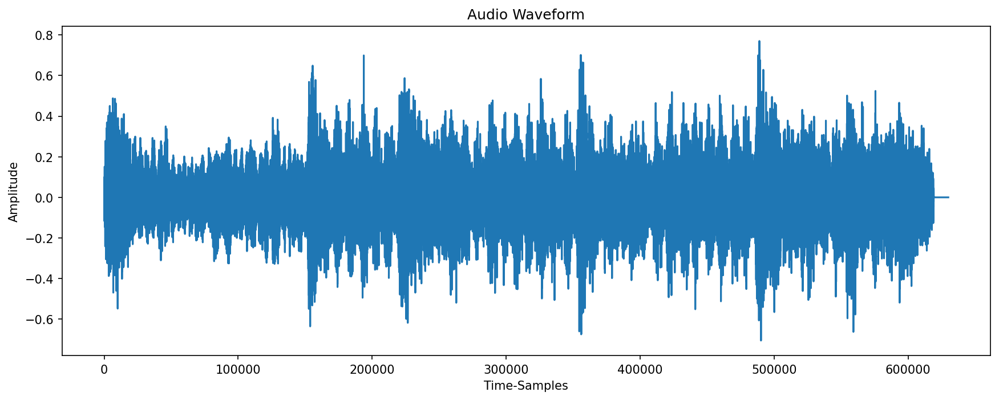

In [15]:
plt.figure(figsize=(14,5), dpi=150)
plt.plot(y)
plt.xlabel('Time-Samples')
plt.ylabel('Amplitude')
plt.title('Audio Waveform')
plt.show()

In [17]:
150000/48000

3.125

In [18]:
from IPython.display import Audio

In [20]:
Audio(data=y, rate=sr) # Vivaldi - Winter :)

In [21]:
# DFT - Discrete Fourier Transform (Digital signal processing to go from that time domain to the frequency domain)
window = np.hanning(len(y))
windowed_input = y * window
dft = np.fft.rfft(windowed_input)

In [23]:
# dft

array([ 2.20216033e+01+0.00000000e+00j, -1.53848612e+01-7.83757079e+00j,
        3.68769589e-01-1.47522648e+01j, ...,
       -5.86705934e-05+1.48828988e-04j, -7.31754172e-05-9.04516760e-05j,
        7.56536829e-05-7.11123767e-05j])

In [24]:
amplitude = np.abs(dft)

In [25]:
amplitude_db = librosa.amplitude_to_db(amplitude, ref=np.max)

In [26]:
frequency = librosa.fft_frequencies(sr=sr, n_fft=len(y))

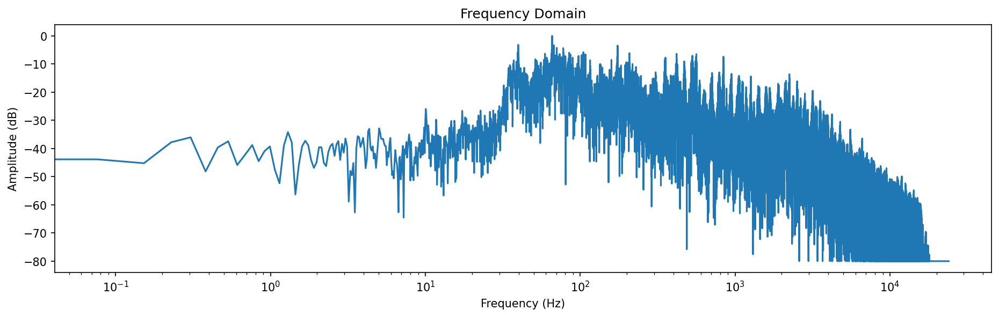

In [27]:
plt.figure(figsize=(15,4), dpi=150)
plt.plot(frequency, amplitude_db)
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude (dB)')
plt.title('Frequency Domain')
plt.xscale('log')
plt.show()

In [28]:
D = librosa.stft(y)
D_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)

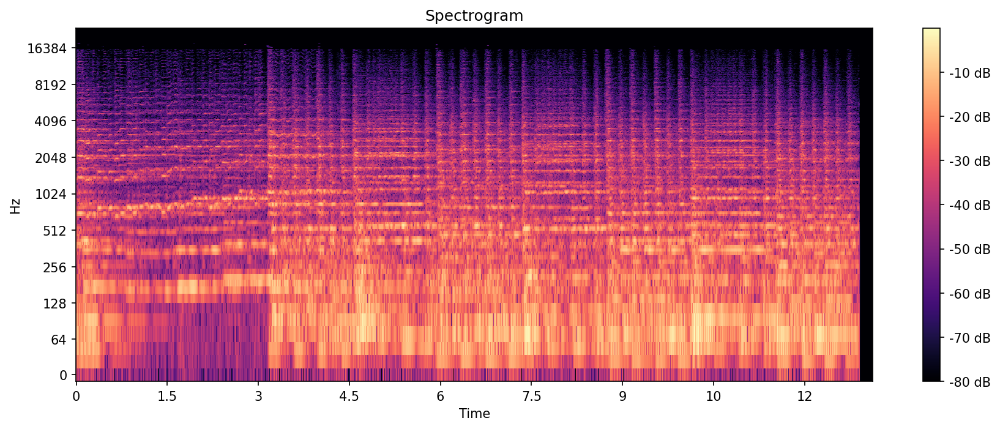

In [31]:
plt.figure(figsize=(14,5), dpi=150)
librosa.display.specshow(D_db, sr=sr, x_axis='time', y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.title('Spectrogram')
plt.show()

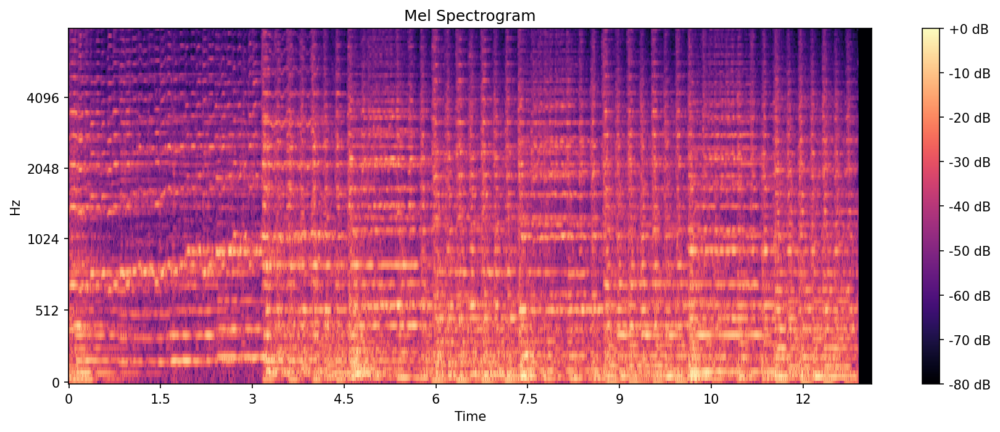

In [34]:
S = librosa.feature.melspectrogram(y=y, sr=sr, n_mels=128, fmax=8000)
S_db = librosa.power_to_db(S, ref=np.max)

plt.figure(figsize=(14,5), dpi=150)
librosa.display.specshow(S_db, sr=sr, x_axis='time', y_axis='mel', fmax=8000)
plt.colorbar(format='%+2.0f dB')
plt.title('Mel Spectrogram')
plt.show()

## Audio Classification

- Hugging Face offers many open-source models that can classify audio into a variety of categories, for example, classifying emotions of a voice, or genres of music.

- Keep in mind tahat for most tasks, you'll need to find a model that has relevant classification categories if you do not want to fine-tune your own model.
- Fortunately there are already many available, everything from bird sound classifications to english accent classification.

- We can easily use these models via the transformers libraries, allowing us to separate the preprocessing from the model prediction.
- Alternatively we can load models into a pipeline and achieve the final classification result with a single call to the model while providing the raw audio.

- Important Note:
  - Many of the audio based models and pipelines require torch, torchaudio, and transformers. Make sure when installnig these libraries that you are using versions that are competible with each other. Sometimes torch and torchaudio latest versions are a step ahead of what is compatible with the latest transformers.
  - Also transformer versions of pipelines that work for certain models (such as Stable Diffusion Video) sometimes need to be downgraded or upgraded to work with audio based pipelines.
  - Pay careful attention o versions and error codes when switching ML tasks!

In [35]:
import torch, transformers, torchaudio
print(torch.__version__)
print(torchaudio.__version__)
print(transformers.__version__)

2.3.1+cu121
2.3.1+cu121
4.42.4


In [36]:
from transformers import AutoFeatureExtractor, ASTForAudioClassification

In [38]:
import librosa

In [39]:
audio_path = '04-Audio-Models/example.mp3'

In [40]:
y, sr = librosa.load(audio_path, sr=None)

In [41]:
sr

48000

In [42]:
feature_extractor = AutoFeatureExtractor.from_pretrained("MIT/ast-finetuned-audioset-10-10-0.4593")

preprocessor_config.json:   0%|          | 0.00/297 [00:00<?, ?B/s]

In [43]:
y

array([-0.05220421, -0.06220762, -0.04791953, ...,  0.        ,
        0.        ,  0.        ], dtype=float32)

In [44]:
# common error: was trained using a sampling rate of 16000. Please make sure that the provided `raw_speech` input was sampled with 16000 and not 48000.
result = feature_extractor(y, sampling_rate=sr)

ValueError: The model corresponding to this feature extractor: ASTFeatureExtractor {
  "do_normalize": true,
  "feature_extractor_type": "ASTFeatureExtractor",
  "feature_size": 1,
  "max_length": 1024,
  "mean": -4.2677393,
  "num_mel_bins": 128,
  "padding_side": "right",
  "padding_value": 0.0,
  "return_attention_mask": false,
  "sampling_rate": 16000,
  "std": 4.5689974
}
 was trained using a sampling rate of 16000. Please make sure that the provided `raw_speech` input was sampled with 16000 and not 48000.

In [47]:
result = feature_extractor(y, return_tensors='pt')

It is strongly recommended to pass the `sampling_rate` argument to this function. Failing to do so can result in silent errors that might be hard to debug.


In [48]:
result

{'input_values': tensor([[[ 0.0770, -0.2676,  0.1092,  ..., -1.2776, -1.2776, -1.2776],
         [ 0.0846, -0.2771,  0.0997,  ..., -1.2776, -1.2776, -1.2776],
         [-0.2939, -0.3674,  0.0095,  ..., -1.2776, -1.2776, -1.2776],
         ...,
         [ 0.2184, -0.0845,  0.2923,  ..., -1.2776, -1.2776, -1.2776],
         [ 0.1963, -0.1293,  0.2475,  ..., -1.2776, -1.2776, -1.2776],
         [-0.0509, -0.4521, -0.0752,  ..., -1.2776, -1.2776, -1.2776]]])}

In [49]:
model = ASTForAudioClassification.from_pretrained("MIT/ast-finetuned-audioset-10-10-0.4593")

config.json:   0%|          | 0.00/26.8k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

In [50]:
result['input_values']

tensor([[[ 0.0770, -0.2676,  0.1092,  ..., -1.2776, -1.2776, -1.2776],
         [ 0.0846, -0.2771,  0.0997,  ..., -1.2776, -1.2776, -1.2776],
         [-0.2939, -0.3674,  0.0095,  ..., -1.2776, -1.2776, -1.2776],
         ...,
         [ 0.2184, -0.0845,  0.2923,  ..., -1.2776, -1.2776, -1.2776],
         [ 0.1963, -0.1293,  0.2475,  ..., -1.2776, -1.2776, -1.2776],
         [-0.0509, -0.4521, -0.0752,  ..., -1.2776, -1.2776, -1.2776]]])

In [51]:
prediction_logits = model(result['input_values']).logits

In [52]:
prediction_logits

tensor([[ -5.9081,  -9.2253,  -9.4442,  -9.4990, -10.3686,  -9.8169, -10.5372,
          -9.9140, -11.0119, -11.1294, -10.8732, -11.3651, -12.3890, -11.9322,
         -10.1947, -10.5203, -10.9214, -11.4615, -11.2874, -10.9701, -11.3812,
         -11.1792, -10.5879, -10.7083,  -9.4158, -11.2141, -10.9959,  -8.1345,
          -8.3063, -12.1890,  -8.9141,  -8.1373,  -9.5586, -10.1567, -10.2660,
         -11.6801, -10.3482, -10.8475, -10.4001, -10.8535, -11.0698,  -9.5788,
         -12.0086, -10.2645, -10.1869, -10.8037, -10.6147, -10.8702, -11.1633,
         -11.6032, -12.3197, -11.4073, -10.7273, -10.6266, -10.7189, -10.2814,
         -12.3984, -10.6907, -11.4477, -10.8104, -12.4599, -10.8371, -11.6523,
         -11.1757,  -8.7801,  -9.1707, -11.2029, -10.2863, -11.8267,  -9.5817,
         -10.8891, -11.8293,  -7.8608,  -8.4752,  -9.2617, -10.5787, -10.6426,
         -10.5211,  -9.6369, -11.0325,  -9.8193,  -9.8407, -11.3109, -10.0102,
          -9.1413, -11.3183,  -9.6363, -10.5181, -10

In [53]:
predicted_class_ids = torch.argmax(prediction_logits, dim=-1).item()

In [54]:
predicted_class_ids

137

In [56]:
model.config.id2label[predicted_class_ids]

'Music'

In [57]:
from transformers import pipeline

In [58]:
pipe = pipeline('audio-classification', model='MIT/ast-finetuned-audioset-10-10-0.4593')

In [59]:
pipe.model

ASTForAudioClassification(
  (audio_spectrogram_transformer): ASTModel(
    (embeddings): ASTEmbeddings(
      (patch_embeddings): ASTPatchEmbeddings(
        (projection): Conv2d(1, 768, kernel_size=(16, 16), stride=(10, 10))
      )
      (dropout): Dropout(p=0.0, inplace=False)
    )
    (encoder): ASTEncoder(
      (layer): ModuleList(
        (0-11): 12 x ASTLayer(
          (attention): ASTSdpaAttention(
            (attention): ASTSdpaSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.0, inplace=False)
            )
            (output): ASTSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.0, inplace=False)
            )
          )
          (intermediate): ASTIntermediate(
       

In [60]:
pipe(audio_path)

/usr/local/lib/python3.10/dist-packages/transformers/models/audio_spectrogram_transformer/feature_extraction_audio_spectrogram_transformer.py:118: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  waveform = torch.from_numpy(waveform).unsqueeze(0)


[{'score': 0.4848679304122925, 'label': 'Music'},
 {'score': 0.19131094217300415, 'label': 'Violin, fiddle'},
 {'score': 0.08519717305898666, 'label': 'Musical instrument'},
 {'score': 0.046924252063035965, 'label': 'Bowed string instrument'},
 {'score': 0.04536101222038269, 'label': 'Orchestra'}]

## Audio Transcription

- A common use case for audio based machine learning models is to transcribe human speech.
- Another use case is to detect different speakers during a conversation, this is known as diarization.
- To create a time-stamped transcription of a conversation, we need both these capabilities.

- We'll combine two different machine learning models:
  - Diarization
    - Clustering audio features into different speakers
  - Transcription
    - Converting audio speech into text

- Using both of these models we can first timestamp and identify the different speakers ini the conversation, and then use those timestamps to transcribe the audio per speaker.
- This means we'll use two seperate models, a diarization model to detect speaker timestamps and then a transcription model to transcribe the timestamped audio.

- This will be more realistic example of combining models and tools from Hugging Face to create a custom solution.

In [ ]:
! pip install pyannote.audio

In [2]:
from pyannote.audio import Pipeline

In [24]:
from google.colab import userdata
from huggingface_hub import login
HF_TOKEN = userdata.get('HF_TOKEN1')
login(token=HF_TOKEN)

The token has not been saved to the git credentials helper. Pass `add_to_git_credential=True` in this function directly or `--add-to-git-credential` if using via `huggingface-cli` if you want to set the git credential as well.
Token is valid (permission: read).
Your token has been saved to /root/.cache/huggingface/token
Login successful


In [4]:
diarization_pipeline = Pipeline.from_pretrained('pyannote/speaker-diarization-3.1', use_auth_token=True)

config.yaml:   0%|          | 0.00/469 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/5.91M [00:00<?, ?B/s]

config.yaml:   0%|          | 0.00/399 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/26.6M [00:00<?, ?B/s]

config.yaml:   0%|          | 0.00/221 [00:00<?, ?B/s]

1. Update the PyAnnote version to ‘2.1.1’ using ‘pip install --upgrade pyannote.audio’
2. visit “pyannote/speaker-diarization · Hugging Face 231” and accept user conditions
3. visit “pyannote/segmentation · Hugging Face 175” and accept user conditions
4. Generate, only ‘READ’ token using your Huggingface account settings–>access Tokens
5. Login to Huggingface through the command line using the command “huggingface-cli login”. This will ask you the token created in step 4 and then append this token under your ‘.huggingface’ folder.

https://discuss.huggingface.co/t/pyannote-speaker-diarization-giving-401-client-error/25125/9

In [ ]:
# pip install -U "huggingface_hub[cli]"

In [5]:
from pyannote.audio.pipelines.utils.hook import ProgressHook

In [10]:
with ProgressHook() as hook:
  diarization = diarization_pipeline("04-Audio-Models/interview.mp3", hook=hook)

Output()

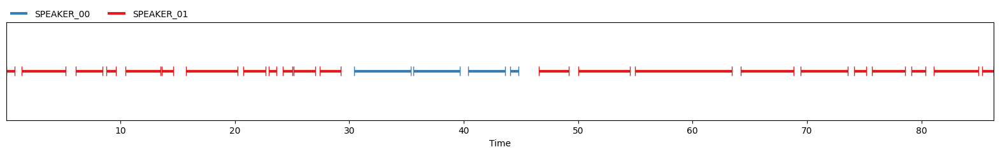

In [11]:
diarization

In [15]:
from IPython.display import Audio

audio = Audio("04-Audio-Models/interview.mp3")
audio

In [18]:
for turn, _, speaker in diarization.itertracks(yield_label=True):
  print(f"start={turn.start:.2f}s stop={turn.end:.2f}s speaker_{speaker}")

start=0.03s stop=0.76s speaker_SPEAKER_01
start=1.38s stop=5.23s speaker_SPEAKER_01
start=6.09s stop=8.43s speaker_SPEAKER_01
start=8.79s stop=9.58s speaker_SPEAKER_01
start=10.46s stop=13.50s speaker_SPEAKER_01
start=13.62s stop=14.59s speaker_SPEAKER_01
start=15.72s stop=20.23s speaker_SPEAKER_01
start=20.75s stop=22.68s speaker_SPEAKER_01
start=22.96s stop=23.64s speaker_SPEAKER_01
start=24.20s stop=25.02s speaker_SPEAKER_01
start=25.14s stop=27.01s speaker_SPEAKER_01
start=27.42s stop=29.24s speaker_SPEAKER_01
start=30.44s stop=35.40s speaker_SPEAKER_00
start=35.60s stop=39.67s speaker_SPEAKER_00
start=40.38s stop=43.60s speaker_SPEAKER_00
start=44.04s stop=44.77s speaker_SPEAKER_00
start=46.56s stop=49.17s speaker_SPEAKER_01
start=50.00s stop=54.52s speaker_SPEAKER_01
start=54.99s stop=63.43s speaker_SPEAKER_01
start=64.21s stop=68.85s speaker_SPEAKER_01
start=69.45s stop=73.54s speaker_SPEAKER_01
start=74.11s stop=75.19s speaker_SPEAKER_01
start=75.70s stop=78.55s speaker_SPEAKER

In [19]:
def consolidate_speaker_segments(diarization):
  consolidated_segments = []
  current_speaker = None
  segment_start=None

  for turn, _, speaker in diarization.itertracks(yield_label=True):
    if speaker != current_speaker:
      if current_speaker is not None:
        consolidated_segments.append((current_speaker, segment_start, turn.start))
      current_speaker = speaker
      segment_start = turn.start
    segment_end = turn.end

  if current_speaker is not None:
    consolidated_segments.append((current_speaker, segment_start, turn.end))

  return consolidated_segments

In [20]:
segments = consolidate_speaker_segments(diarization)
segments

[('SPEAKER_01', 0.03096875, 30.43971875),
 ('SPEAKER_00', 30.43971875, 46.555343750000006),
 ('SPEAKER_01', 46.555343750000006, 86.31284375)]

In [ ]:
# ! pip install pydub

In [25]:
from pydub import AudioSegment
import os

In [23]:
def split_audio_segments(audio_file, segments, output_dir='segmented_audio'):
  os.makedirs(output_dir, exist_ok=True)

  audio = AudioSegment.from_file(audio_file)

  for idx, (speaker, start, end) in enumerate(segments):
    # Calculate start and end in milliseconds
    start_ms = start * 1000
    end_ms = end * 1000

    # Extract the segment
    segment = audio[start_ms:end_ms]

    # Create the output file name
    speaker_label = speaker.split('_')[-1] # Get speaker identifier
    output_file = os.path.join(output_dir, f"{idx:02d}_SPEAKER{speaker_label}_START{start:.0f}_STOP{end:.0f}.mp3")

    # Export the segment as a new audio file
    segment.export(output_file, format='mp3')
    print(f"Exported to {output_file}")

In [26]:
split_audio_segments("04-Audio-Models/interview.mp3", segments)

Exported to segmented_audio/00_SPEAKER01_START0_STOP30.mp3
Exported to segmented_audio/01_SPEAKER00_START30_STOP47.mp3
Exported to segmented_audio/02_SPEAKER01_START47_STOP86.mp3


In [27]:
# Use a pipeline as a high-level helper
from transformers import pipeline

pipe = pipeline("automatic-speech-recognition", model="facebook/wav2vec2-base-960h")

config.json:   0%|          | 0.00/1.60k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/378M [00:00<?, ?B/s]

Some weights of the model checkpoint at facebook/wav2vec2-base-960h were not used when initializing Wav2Vec2ForCTC: ['wav2vec2.encoder.pos_conv_embed.conv.weight_g', 'wav2vec2.encoder.pos_conv_embed.conv.weight_v']
- This IS expected if you are initializing Wav2Vec2ForCTC from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing Wav2Vec2ForCTC from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of Wav2Vec2ForCTC were not initialized from the model checkpoint at facebook/wav2vec2-base-960h and are newly initialized: ['wav2vec2.encoder.pos_conv_embed.conv.parametrizations.weight.original0', 'wav2vec2.encoder.pos_conv_embed.conv.parametrizations.weight.original1', 'wav2vec2.masked_spec_embed']
You sho

tokenizer_config.json:   0%|          | 0.00/163 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/291 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/85.0 [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/159 [00:00<?, ?B/s]

In [28]:
# pipe("04-Audio-Models/interview.mp3")

{'text': "MOST OF US WOULD BE SURPRISED TO HEAR THAT THE UNIVERSE IS GOING TO END ONE DAY WE EXPECT THE UNIVERSE TO GO ON FOREVER INTO THE FUTURE WHY DO WE HAVE THE IDEA THAT IT DOESN'T GO ON FOREVER INTO THE PAST I NOT SAYING I KNOW THE ANSWER TO THIS THIS IS ONE OF THE DEEPEST QUESTIONS WE DO NOT KNOW THE ANSWER WE SIMPLY HAVE TO KEEP AN OPEN MIND ALL OF US PHILOSOPHERS SCIENCES RELIGIOUS PEOPLE NO ONE IN FACT KNOWS YOU MAKE THE ARGUMENT IN PALE BLUE DOT THAT IT'S TIME TO HIT THE ROAD AGAIN SKYWARD AS IN SPACE TRAVEL EXPLORATION PERHAPS COLONIES FOR THE VERY SALVATION OF THE SPECIES HOW IS THAT WELL FIRST OFFI AS YOU SUGGEST WE WE ARE A WANDERING SPECIES WE COME FROM HUNTER GATHERERS WE ORE NOMADS AND FOR THE MILLION YEARS THAT THE HUMAN FAMILY HAS BEEN AROUND THAT WAS OUR LIFE STYLE THAT MUST BE BUILT INTO US DEEPLY IT'S ONLY THE LAST TEN THOUSAND YEARS THAT WE'VE HAD A SETTLED AND SEDENTARY EXISTENCE AND NOW THE EARTH IS ALL EXPLORED OUR EXPLORATORY INSTINCTS SIR UNFULFILLED AND I 

In [34]:
import os
import re

def process_segmented_files(directory='segmented_audio'):
  if not os.path.exists(directory):
    raise FileNotFoundError(f"Directory '{directory}' not found.")

  files = os.listdir(directory)

  for file in files:
    file_path = os.path.join(directory, file)
    if os.path.isfile(file_path):
      text = pipe(file_path)['text']
      num, speaker, time_start, time_end = file.split('_')
      time_end = time_end.replace(".mp3", '')
      print(f"{speaker}-- {time_start}sec {time_end}sec:\n {text}\n")

In [35]:
process_segmented_files()

SPEAKER01-- START0sec STOP30sec:
 MOST OF US WOULD BE SURPRISED TO HEAR THAT THE UNIVERSE IS GOING TO END ONE DAY WE EXPECT THE UNIVERSE TO GO ON FOREVER INTO THE FUTURE WHY DO WE HAVE THE IDEA THAT IT DOESN'T GO ON FOREVER INTO THE PAST I'M NOT SAYING I KNOW THE ANSWER TO THIS THIS IS ONE OF THE DEEPEST QUESTIONS AND WE DO NOT KNOW THE ANSWER WE SIMPLY HAVE TO KEEP AN OPEN MIND ALL OF US PHILOSOPHERS SCIENCES RELIGIOUS PEOPLE NO ONE IN FACT KNOWS

SPEAKER00-- START30sec STOP47sec:
 YOU MAKE THE ARGUMENT IN PALE BLUE DOT THAT IT'S TIME TO HIT THE ROAD AGAIN SKYWARD AS IN SPACE TRAVEL EXPLORATION PERHAPS COLONIES FOR THE VERY SALVATION OF THE SPECIES HOW IS THAT

SPEAKER01-- START47sec STOP86sec:
 WELL FIRST OFF AS YOU SUGGEST WE A WE ARE A WANDERING SPECIES WE COME FROM HUNTER GATHERERS WE ORE GNOMADS AND FOR THE MILLION YEARS THAT THE HUMAN FAMILY HAS BEEN AROUND THAT WAS OUR LIFE STYLE THAT MUST BE BUILT INTO US DEEPLY IT'S ONLY THE LAST TEN THOUSAND YEARS THAT WE'VE HAD A SETTLED AN

## Audio Generation

In [36]:
import transformers
print(transformers.__version__)

4.42.4


In [37]:
from transformers import pipeline
pipe = pipeline("text-to-speech", model="suno/bark-small")

config.json:   0%|          | 0.00/8.80k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/1.68G [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/4.91k [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/353 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/996k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/2.92M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/125 [00:00<?, ?B/s]

In [39]:
text = "Hello, how are you today?"

In [40]:
output = pipe(text)

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:10000 for open-end generation.
The attention mask is not set and cannot be inferred from input because pad token is same as eos token.As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.


In [42]:
output['audio']

array([[ 0.017654  ,  0.02676171,  0.04593005, ..., -0.03174675,
        -0.00137001,  0.03154888]], dtype=float32)

In [43]:
output.keys()

dict_keys(['audio', 'sampling_rate'])

In [44]:
from IPython.display import Audio

In [45]:
Audio(data=output['audio'], rate=output['sampling_rate'])

In [46]:
from pydub import AudioSegment

In [47]:
audio_seg = AudioSegment(output['audio'].tobytes(),
                         frame_rate=output['sampling_rate'],
                         sample_width=output['audio'].dtype.itemsize,
                         channels=1)

In [48]:
audio_seg.export('text_to_speech_example.mp3', format='mp3')

<_io.BufferedRandom name='text_to_speech_example.mp3'>